In [292]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt





Run lmm regression:

Pos_arousal = w_score + NAcc_TR_x + (subject)

### Notes
#### Offset: 
- When combining both types of trailers, anterior insula shows a significant positive correlation with negative arousal (r=0.17489; p-value=1.7246341016483672e-06). Also, anterior insual shows a negative correlation with watch scores (r=-0.07491; p-value=0.04175856809627057).
- For horror trailers alone, NAcc has a significant positive correlation with positive arousal (r=0.15077; p-value= 0.003743392014030906); AIns has a significant positive correlation with negative arousal (r=0.13562; p-value=0.009192194315207748). 
- For comedy trailers alone, NAcc has a significant negative correlation with positive arousal (r=-0.11963; p-value=0.021179442433856898). Also, NAcc is negatively correlated with watch scores (r=0.10155; p-value=0.050637663806451946).
#### Positive peak: 
- When combining both trailers, the positive peak of AIns is positively correlated with negative arousal (r=0.092; p-value=0.01235140998911575)
#### Negative peak: 


- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Get peak, above 1 std above zero.
- Reality check with V1 for all subjects.


# Homemade functions

In [293]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [294]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-.95, fontsize=12)

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-1.05, fontsize=12)

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=.07, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)




In [295]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [296]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

# Clean data

In [297]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [298]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
all_subs_events_df.shape

(868, 47)

In [299]:
# Drop outliers from positive arousal. 
print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from negative arousal.
all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from watch score.

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.8]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset"] > -0.6]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -1.1]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)





The shape of the dataframe before dropping outliers is:  (868, 47)
The shape of the dataframe after dropping 'positive arousal' outliers is:  (866, 47)
The shape of the dataframe after dropping 'negative arousal' outliers is:  (865, 47)
The shape of the dataframe after dropping 'NAcc' outliers is:  (860, 47)
The shape of the dataframe after dropping 'AIns' outliers is:  (858, 47)


In [300]:
# Separate files based on type of trailer. 
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Comedy.csv')


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.8355 with a p-value of: 7.377028081105603e-225
The correlation between W_score and Neg_arousal is: -0.6634 with a p-value of: 6.466564351107212e-110


Text(-0.8, -2, 'r= -0.6634; p-value: 6.466564351107212e-110')

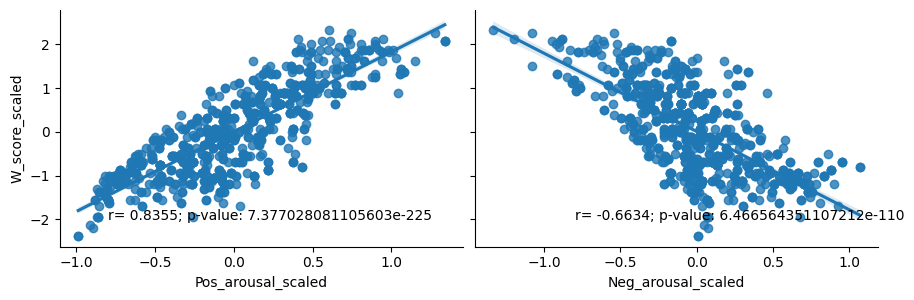

In [301]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

W_PA_NA_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    height=3,
    aspect=1.5)

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 0].text(s=W_PA_string, x=-.8, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 1].text(s=W_NA_string, x=-.8, y=-2, fontsize=10)


In [302]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_NA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between W_score and Neg_arousal for comedy trailers is: " + str(round(W_NA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_NA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_NA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between W_score and Neg_arousal for horror trailers is: " + str(round(W_NA_horror_corr[0], 4)) + " with a p-value of: " + str((W_NA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.9078 with a p-value of: 9.004903425277944e-165
The correlation between W_score and Neg_arousal for comedy trailers is: -0.6845 with a p-value of: 3.816481389842055e-61

The correlation between W_score and Pos_arousal for horror trailers is: 0.8016 with a p-value of: 1.514049911082475e-96
The correlation between W_score and Neg_arousal for horror trailers is: -0.6392 with a p-value of: 3.482151848958289e-50


Text(-0.8, -2.5, 'H r= 0.8016; p-value: 1.514049911082475e-96')

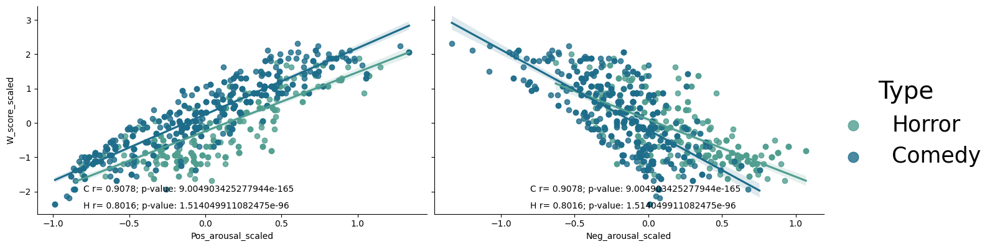

In [303]:
W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    hue="Type",
    height=4,
    aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

<Axes: xlabel='Type', ylabel='Neg_arousal_scaled'>

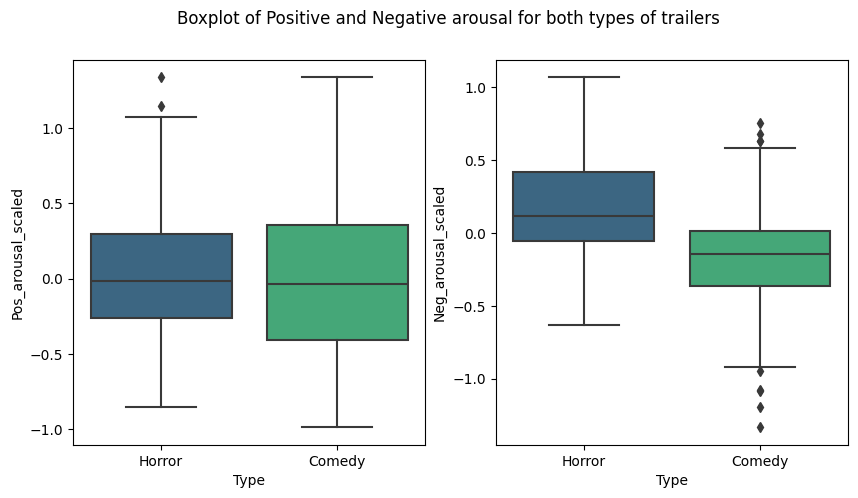

In [304]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

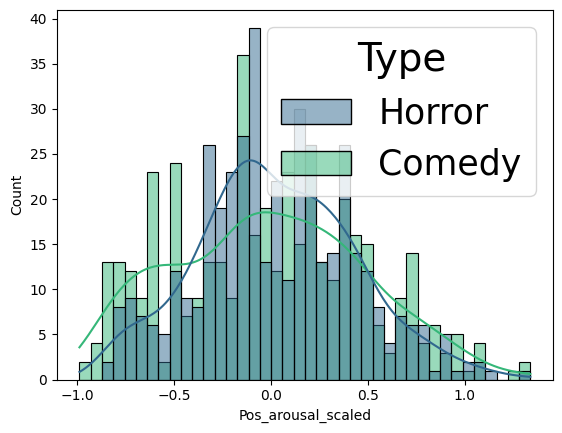

In [305]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)
#sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='W_score_scaled', ylabel='Count'>

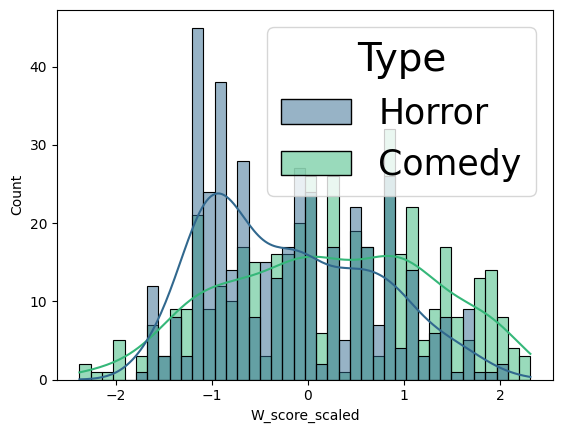

In [306]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_1046/3263024937.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")


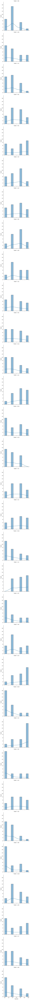

In [307]:
sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

In [308]:
# Correlation with Positive Arousal. 
NAcc_PA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores. 
NAcc_W_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["W_score_scaled"])
AIns_W_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["W_score_scaled"])
MPFC_W_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_All_corr[1])))


For both types of trailers, the correlation between NAcc whole activation and positive arousal is: 0.05162 with a p-value of: 0.13080854050531837
For both types of trailers, the correlation between AIns whole activation and positive arousal is: 0.07278 with a p-value of: 0.03304365128947102
For both types of trailers, the correlation between MPFC whole activation and positive arousal is: -0.02298 with a p-value of: 0.501454902812861

For both types of trailers, the correlation between NAcc whole activation and negative arousal is: 0.01247 with a p-value of: 0.7153087862877261
For both types of trailers, the correlation between AIns whole activation and negative arousal is: 0.15241 with a p-value of: 7.3225666858825585e-06
For both types of trailers, the correlation between MPFC whole activation and negative arousal is: -0.01855 with a p-value of: 0.5874745366793981

For both types of trailers, the correlation between NAcc whole activation and watch scores is: 0.03108 with a p-value of:

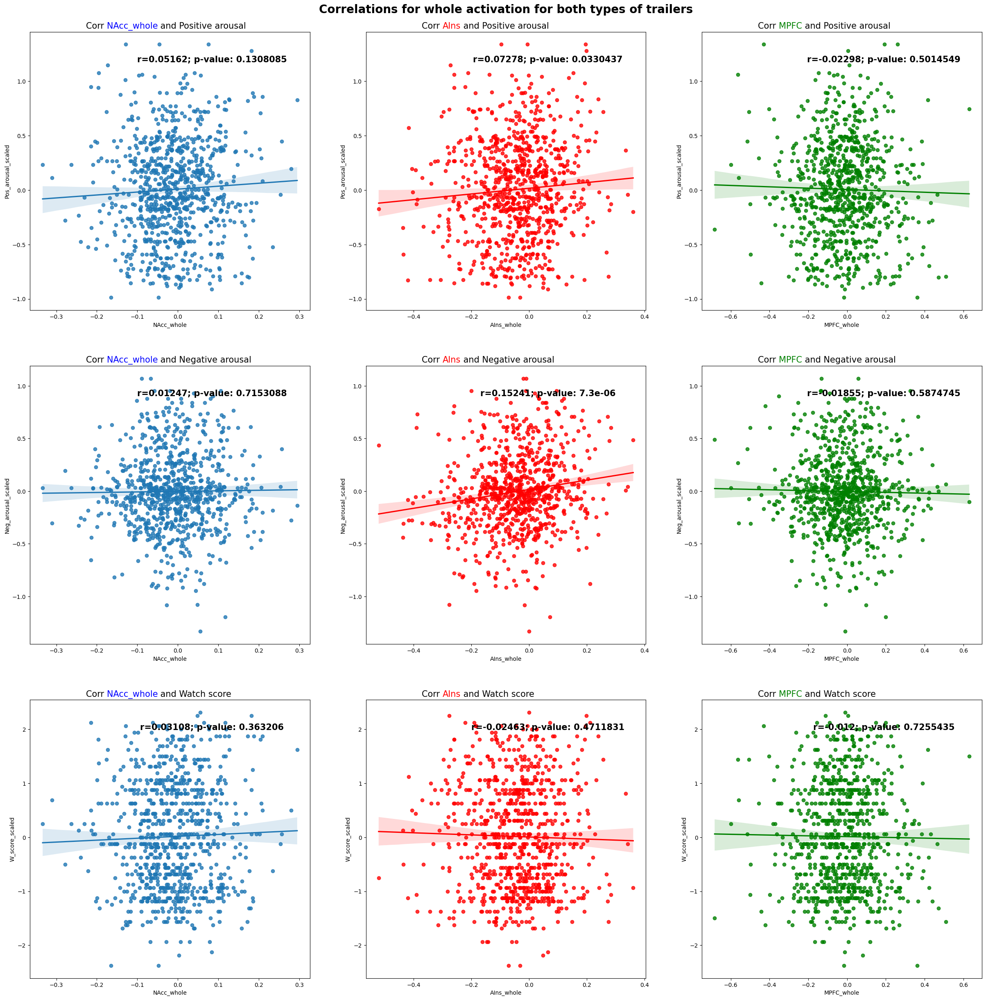

In [309]:
whole_all_corr = [NAcc_PA_whole_All_corr, NAcc_NA_whole_All_corr, NAcc_W_whole_All_corr, AIns_PA_whole_All_corr, AIns_NA_whole_All_corr, AIns_W_whole_All_corr, MPFC_PA_whole_All_corr, MPFC_NA_whole_All_corr, MPFC_W_whole_All_corr]

plot_correlations(all_subs_events_df, whole_all_corr, "whole", "Correlations for whole activation for both types of trailers")

In [310]:
# Whole Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["W_score_scaled"])
AIns_W_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_C_corr[1])))
      
      

For comedy trailers, the correlation between NAcc whole activation and positive arousal is: 0.06189 with a p-value of: 0.19868110177663825
For comedy trailers, the correlation between AIns whole activation and positive arousal is: 0.0935 with a p-value of: 0.05186595582042068
For comedy trailers, the correlation between MPFC whole activation and positive arousal is: -0.02223 with a p-value of: 0.6446447381783885

For comedy trailers, the correlation between NAcc whole activation and negative arousal is: -0.02378 with a p-value of: 0.6217504585306787
For comedy trailers, the correlation between AIns whole activation and negative arousal is: 0.05326 with a p-value of: 0.26881941862086856
For comedy trailers, the correlation between MPFC whole activation and negative arousal is: 0.01241 with a p-value of: 0.7967804723816218

For comedy trailers, the correlation between NAcc whole activation and watch scores is: 0.04929 with a p-value of: 0.3061218412697184
For comedy trailers, the correla

In [311]:
# Whole Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["W_score_scaled"])
AIns_W_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["W_score_scaled"])
MPFC_W_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_H_corr[1])))



For horror trailers, the correlation between NAcc whole activation and positive arousal is: 0.03659 with a p-value of: 0.45188381216935725
For horror trailers, the correlation between AIns whole activation and positive arousal is: 0.02643 with a p-value of: 0.5869226707477602
For horror trailers, the correlation between MPFC whole activation and positive arousal is: -0.02284 with a p-value of: 0.6386494099981407

For horror trailers, the correlation between NAcc whole activation and negative arousal is: 0.02455 with a p-value of: 0.6138428111922343
For horror trailers, the correlation between AIns whole activation and negative arousal is: 0.06155 with a p-value of: 0.20541909251393625
For horror trailers, the correlation between MPFC whole activation and negative arousal is: -0.03934 with a p-value of: 0.4185238303868782

For horror trailers, the correlation between NAcc whole activation and watch scores is: 0.02167 with a p-value of: 0.6559600459283739
For horror trailers, the correla

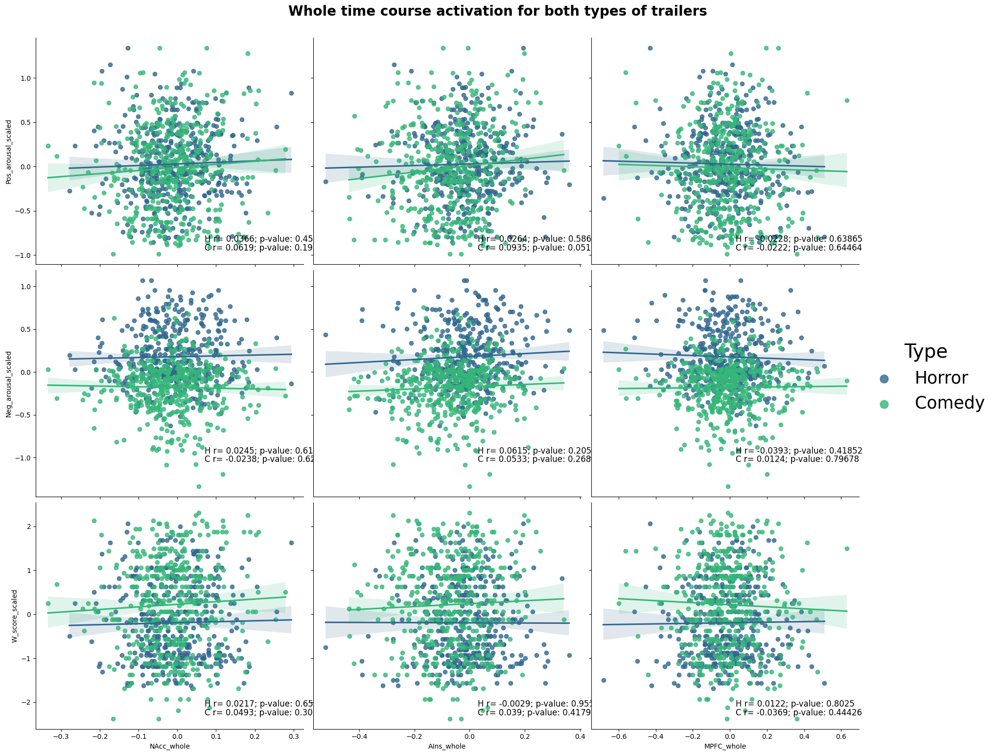

In [312]:
whole_comedy_corr = [NAcc_PA_whole_C_corr, NAcc_NA_whole_C_corr, NAcc_W_whole_C_corr, AIns_PA_whole_C_corr, AIns_NA_whole_C_corr, AIns_W_whole_C_corr, MPFC_PA_whole_C_corr, MPFC_NA_whole_C_corr, MPFC_W_whole_C_corr]
whole_horror_corr = [NAcc_PA_whole_H_corr, NAcc_NA_whole_H_corr, NAcc_W_whole_H_corr, AIns_PA_whole_H_corr, AIns_NA_whole_H_corr, AIns_W_whole_H_corr, MPFC_PA_whole_H_corr, MPFC_NA_whole_H_corr, MPFC_W_whole_H_corr]

title_whole = 'Whole time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "whole", whole_comedy_corr, whole_horror_corr, title_whole)

## Neural Activation Offset 

In [313]:
# Correlation with Positive Arousal. 
NAcc_PA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["W_score_scaled"])
AIns_W_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["W_score_scaled"])
MPFC_W_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_All_corr[1])))

For both types of trailers, the correlation between NAcc offset activation and positive arousal is: 0.03461 with a p-value of: 0.31124619424459965
For both types of trailers, the correlation between AIns offset activation and positive arousal is: 0.0265 with a p-value of: 0.43823411977628685
For both types of trailers, the correlation between MPFC offset activation and positive arousal is: -0.01367 with a p-value of: 0.6891843217951905

For both types of trailers, the correlation between NAcc offset activation and negative arousal is: -0.03441 with a p-value of: 0.31411075978133224
For both types of trailers, the correlation between AIns offset activation and negative arousal is: 0.11409 with a p-value of: 0.0008138527990043074
For both types of trailers, the correlation between MPFC offset activation and negative arousal is: -0.02565 with a p-value of: 0.45311681292565686

For both types of trailers, the correlation between NAcc offset activation and watch scores is: 0.03586 with a p-

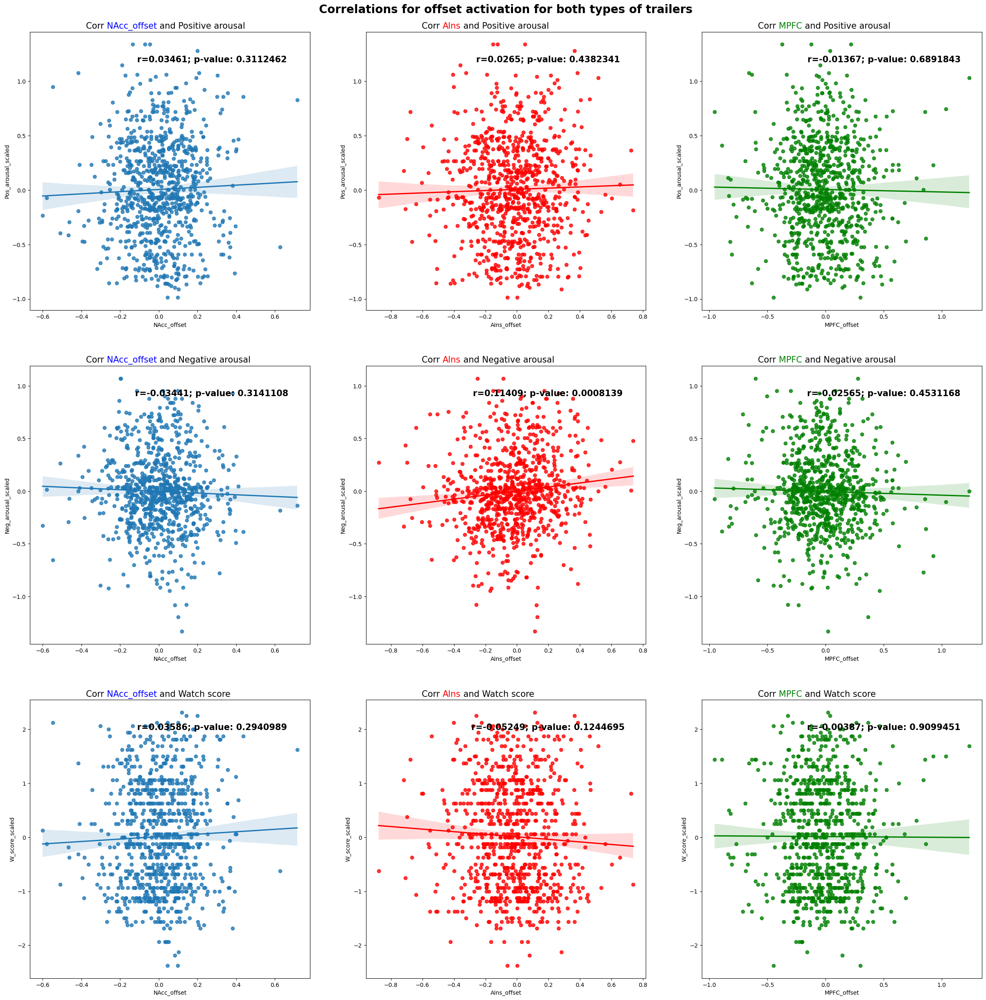

In [314]:
offset_all_corr = [NAcc_PA_Off_All_corr, NAcc_NA_Off_All_corr, NAcc_W_Off_All_corr, AIns_PA_Off_All_corr, AIns_NA_Off_All_corr, AIns_W_Off_All_corr, MPFC_PA_Off_All_corr, MPFC_NA_Off_All_corr, MPFC_W_Off_All_corr]
plot_correlations(all_subs_events_df, offset_all_corr, "offset", "Correlations for offset activation for both types of trailers")

In [315]:
# Offset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_C_corr[1])))
      

For comedy trailers, the correlation between NAcc offset activation and positive arousal is: -0.02981 with a p-value of: 0.5360946001139053
For comedy trailers, the correlation between AIns offset activation and positive arousal is: 0.02803 with a p-value of: 0.5608172074211112
For comedy trailers, the correlation between MPFC offset activation and positive arousal is: -0.01584 with a p-value of: 0.7423419604509591

For comedy trailers, the correlation between NAcc offset activation and negative arousal is: -0.02237 with a p-value of: 0.6424638277074936
For comedy trailers, the correlation between AIns offset activation and negative arousal is: 0.0107 with a p-value of: 0.8242327721027373
For comedy trailers, the correlation between MPFC offset activation and negative arousal is: 0.02112 with a p-value of: 0.6611290510236076

For comedy trailers, the correlation between NAcc offset activation and watch scores is: -0.02177 with a p-value of: 0.6514029725750612
For comedy trailers, the c

In [316]:
# Offset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["W_score_scaled"])
AIns_W_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_H_corr[1])))

For horror trailers, the correlation between NAcc offset activation and positive arousal is: 0.11386 with a p-value of: 0.01887524863045769
For horror trailers, the correlation between AIns offset activation and positive arousal is: 0.0135 with a p-value of: 0.7813258372398225
For horror trailers, the correlation between MPFC offset activation and positive arousal is: -0.00937 with a p-value of: 0.8473470121859961

For horror trailers, the correlation between NAcc offset activation and negative arousal is: -0.02811 with a p-value of: 0.5633063512183302
For horror trailers, the correlation between AIns offset activation and negative arousal is: 0.10401 with a p-value of: 0.03204937012938591
For horror trailers, the correlation between MPFC offset activation and negative arousal is: -0.07365 with a p-value of: 0.12952437723867963

For horror trailers, the correlation between NAcc offset activation and watch scores is: 0.09395 with a p-value of: 0.05295099941892247
For horror trailers, th

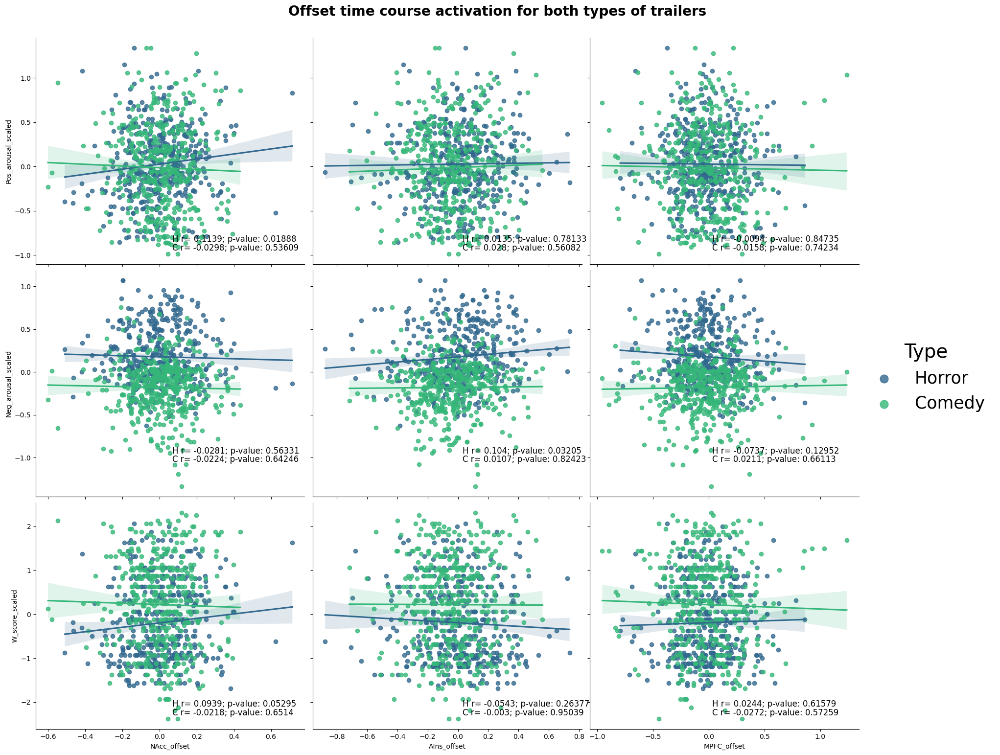

In [317]:
offset_horror_corr = [NAcc_PA_Off_H_corr, NAcc_NA_Off_H_corr, NAcc_W_Off_H_corr, AIns_PA_Off_H_corr, AIns_NA_Off_H_corr, AIns_W_Off_H_corr, MPFC_PA_Off_H_corr, MPFC_NA_Off_H_corr, MPFC_W_Off_H_corr]
offset_comedy_corr = [NAcc_PA_Off_C_corr, NAcc_NA_Off_C_corr, NAcc_W_Off_C_corr, AIns_PA_Off_C_corr, AIns_NA_Off_C_corr, AIns_W_Off_C_corr, MPFC_PA_Off_C_corr, MPFC_NA_Off_C_corr, MPFC_W_Off_C_corr]

title_offset = 'Offset time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "offset", offset_comedy_corr, offset_horror_corr, title_offset)


# Neural activation middle

In [318]:
# Correlation with Positive Arousal.
NAcc_PA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["W_score_scaled"])
AIns_W_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["W_score_scaled"])
MPFC_W_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_All_corr[1])))
      


For both types of trailers, the correlation between NAcc middle activation and positive arousal is: 0.00033 with a p-value of: 0.9922497785907511
For both types of trailers, the correlation between AIns middle activation and positive arousal is: 0.03842 with a p-value of: 0.26097798637502745
For both types of trailers, the correlation between MPFC middle activation and positive arousal is: -0.03985 with a p-value of: 0.24355940312738159

For both types of trailers, the correlation between NAcc middle activation and negative arousal is: 0.02549 with a p-value of: 0.4559313058550197
For both types of trailers, the correlation between AIns middle activation and negative arousal is: 0.11269 with a p-value of: 0.0009443306466640331
For both types of trailers, the correlation between MPFC middle activation and negative arousal is: -0.01979 with a p-value of: 0.5627176931999356

For both types of trailers, the correlation between NAcc middle activation and watch scores is: -0.00893 with a p-v

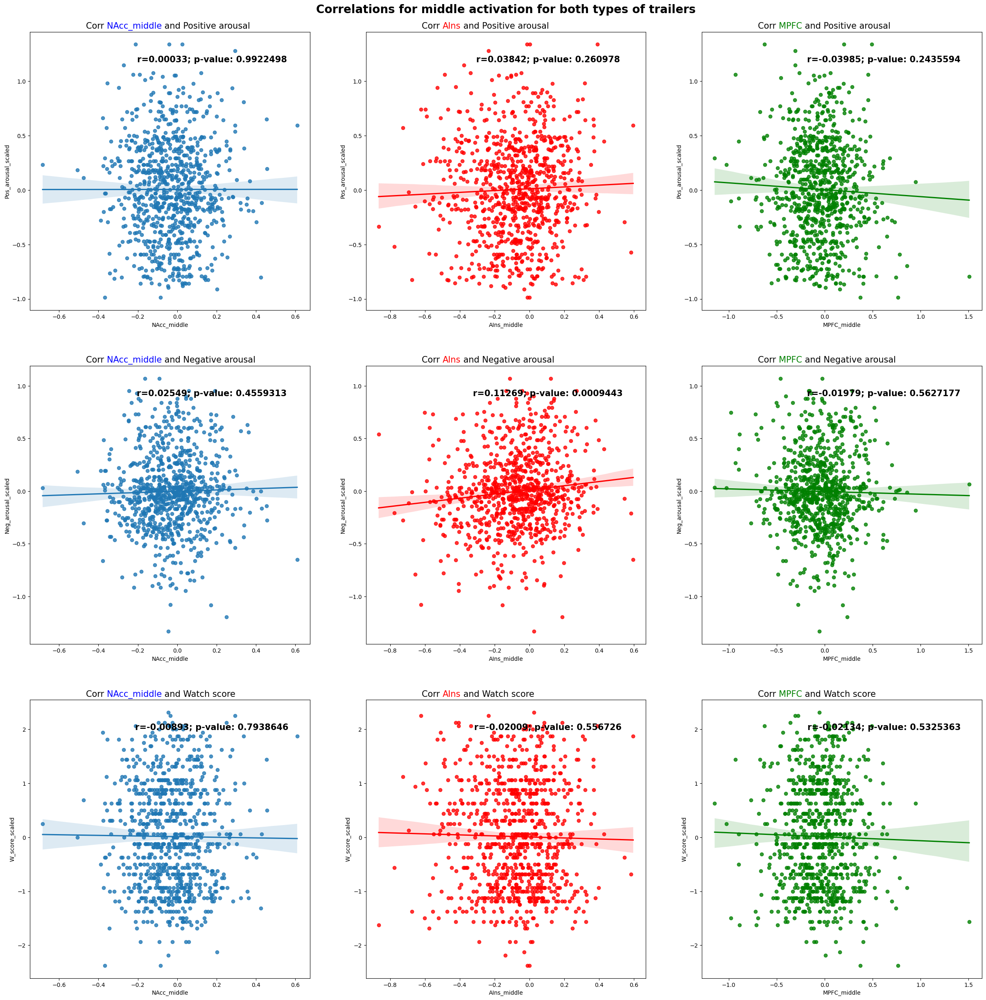

In [319]:
Mid_all_corr = [NAcc_PA_Mid_All_corr, NAcc_NA_Mid_All_corr, NAcc_W_Mid_All_corr, AIns_PA_Mid_All_corr, AIns_NA_Mid_All_corr, AIns_W_Mid_All_corr, MPFC_PA_Mid_All_corr, MPFC_NA_Mid_All_corr, MPFC_W_Mid_All_corr]
plot_correlations(all_subs_events_df, Mid_all_corr, "middle", "Correlations for middle activation for both types of trailers")

In [320]:
# Middle Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_C_corr[1])))


For comedy trailers, the correlation between NAcc middle activation and positive arousal is: -0.00368 with a p-value of: 0.9392049982293895
For comedy trailers, the correlation between AIns middle activation and positive arousal is: 0.02113 with a p-value of: 0.6610459186910539
For comedy trailers, the correlation between MPFC middle activation and positive arousal is: -0.02729 with a p-value of: 0.5711227406925936

For comedy trailers, the correlation between NAcc middle activation and negative arousal is: -0.03324 with a p-value of: 0.49025844754597475
For comedy trailers, the correlation between AIns middle activation and negative arousal is: 0.07391 with a p-value of: 0.12461423909201266
For comedy trailers, the correlation between MPFC middle activation and negative arousal is: -0.0484 with a p-value of: 0.31494418880678593

For comedy trailers, the correlation between NAcc middle activation and watch scores is: 0.01097 with a p-value of: 0.8199012127295493
For comedy trailers, th

In [321]:
# Middle Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["W_score_scaled"])
AIns_W_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_H_corr[1])))

For horror trailers, the correlation between NAcc middle activation and positive arousal is: -0.00076 with a p-value of: 0.9875820980039202
For horror trailers, the correlation between AIns middle activation and positive arousal is: 0.04365 with a p-value of: 0.3693218464212259
For horror trailers, the correlation between MPFC middle activation and positive arousal is: -0.05636 with a p-value of: 0.24632954002581445

For horror trailers, the correlation between NAcc middle activation and negative arousal is: 0.02575 with a p-value of: 0.5965867752825993
For horror trailers, the correlation between AIns middle activation and negative arousal is: -0.00917 with a p-value of: 0.8505147319987398
For horror trailers, the correlation between MPFC middle activation and negative arousal is: -0.01369 with a p-value of: 0.7783331085717822

For horror trailers, the correlation between NAcc middle activation and watch scores is: -0.00627 with a p-value of: 0.8974276797545399
For horror trailers, th

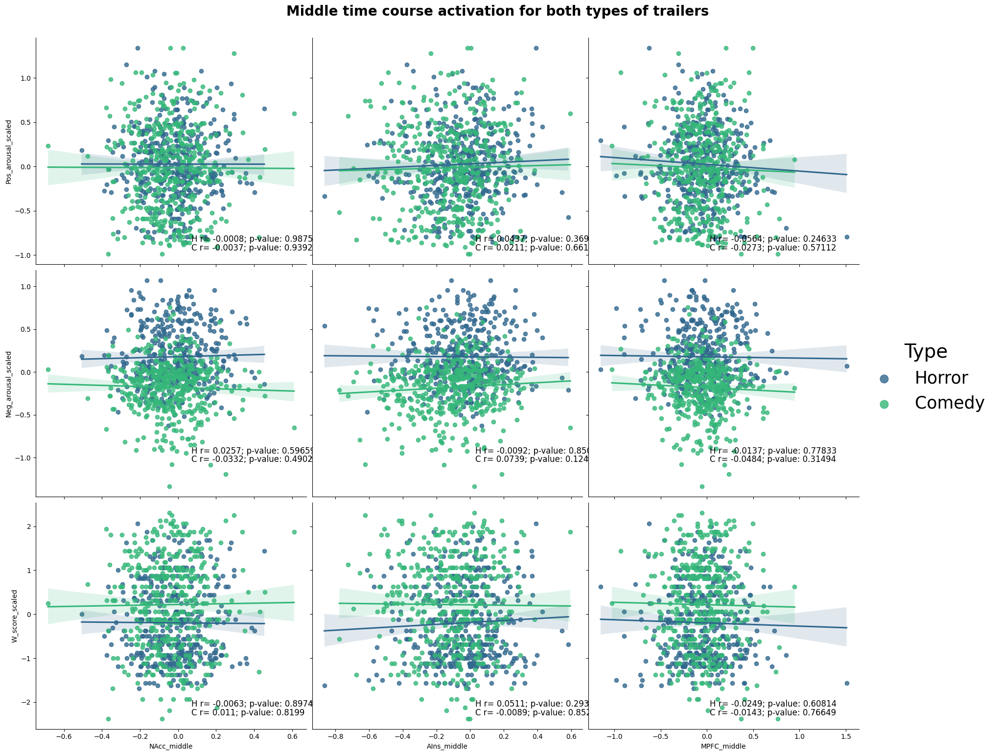

In [322]:
Mid_horror_corr = [NAcc_PA_Mid_H_corr, NAcc_NA_Mid_H_corr, NAcc_W_Mid_H_corr, AIns_PA_Mid_H_corr, AIns_NA_Mid_H_corr, AIns_W_Mid_H_corr, MPFC_PA_Mid_H_corr, MPFC_NA_Mid_H_corr, MPFC_W_Mid_H_corr]
Mid_comedy_corr = [NAcc_PA_Mid_C_corr, NAcc_NA_Mid_C_corr, NAcc_W_Mid_C_corr, AIns_PA_Mid_C_corr, AIns_NA_Mid_C_corr, AIns_W_Mid_C_corr, MPFC_PA_Mid_C_corr, MPFC_NA_Mid_C_corr, MPFC_W_Mid_C_corr]

title_middle = 'Middle time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "middle", Mid_comedy_corr, Mid_horror_corr, title_middle)

## Neural activation onset

In [323]:
# Correlation with Positive Arousal.
NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

For both types of trailers, the correlation between NAcc onset activation and positive arousal is: 0.04912 with a p-value of: 0.1505620109424355
For both types of trailers, the correlation between AIns onset activation and positive arousal is: 0.06766 with a p-value of: 0.04754863866238167
For both types of trailers, the correlation between MPFC onset activation and positive arousal is: 0.013 with a p-value of: 0.7037714974089484

For both types of trailers, the correlation between NAcc onset activation and negative arousal is: 0.02957 with a p-value of: 0.3870205916733599
For both types of trailers, the correlation between AIns onset activation and negative arousal is: 0.04429 with a p-value of: 0.1949444829218332
For both types of trailers, the correlation between MPFC onset activation and negative arousal is: 0.01199 with a p-value of: 0.725766346519477

For both types of trailers, the correlation between NAcc onset activation and watch scores is: 0.02355 with a p-value of: 0.490872

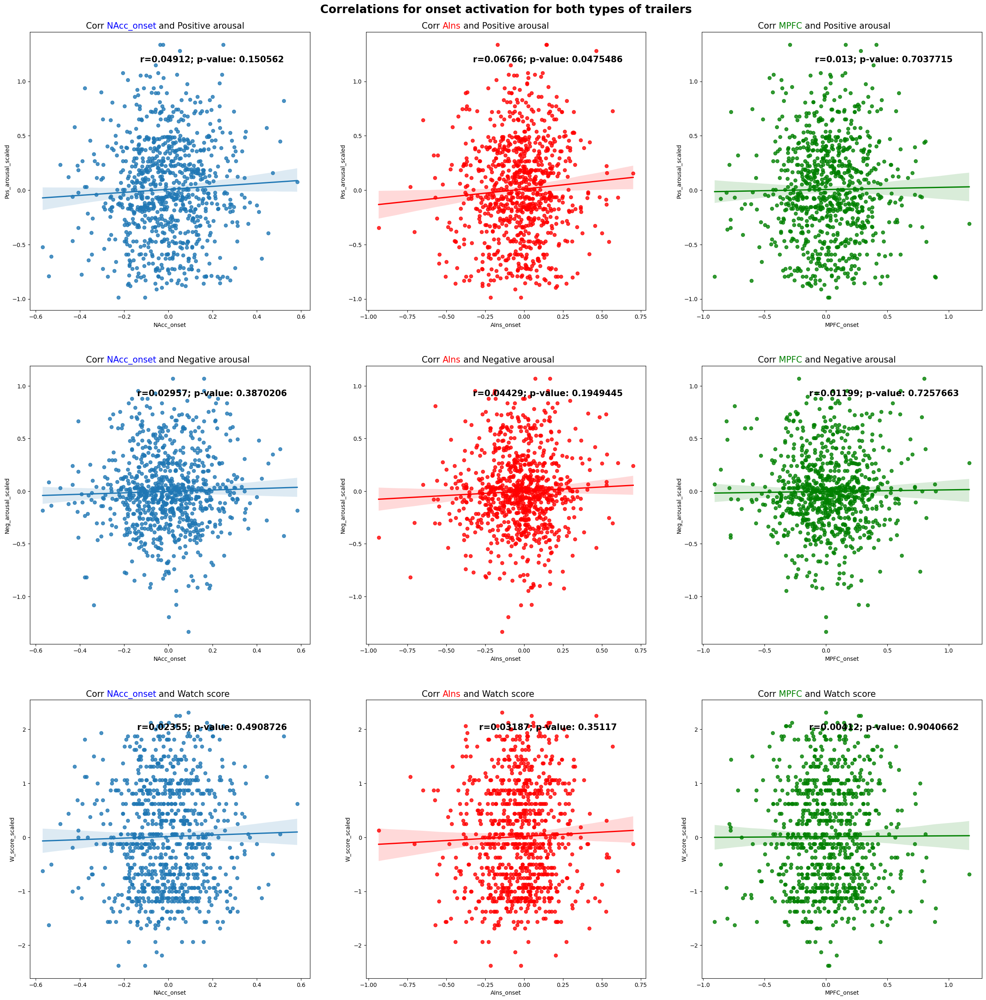

In [324]:
On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

In [325]:
# Onset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

For comedy trailers, the correlation between NAcc onset activation and positive arousal is: 0.13585 with a p-value of: 0.004628853387774669
For comedy trailers, the correlation between AIns onset activation and positive arousal is: 0.12183 with a p-value of: 0.011175326820895235
For comedy trailers, the correlation between MPFC onset activation and positive arousal is: 0.00313 with a p-value of: 0.9482245448025532

For comedy trailers, the correlation between NAcc onset activation and negative arousal is: 0.01479 with a p-value of: 0.7589566863885485
For comedy trailers, the correlation between AIns onset activation and negative arousal is: 0.01156 with a p-value of: 0.8105132892002509
For comedy trailers, the correlation between MPFC onset activation and negative arousal is: 0.04969 with a p-value of: 0.3022088253738464

For comedy trailers, the correlation between NAcc onset activation and watch scores is: 0.09258 with a p-value of: 0.05423334232802199
For comedy trailers, the correl

In [326]:
# Onset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

For horror trailers, the correlation between NAcc onset activation and positive arousal is: -0.05337 with a p-value of: 0.2722973464761311
For horror trailers, the correlation between AIns onset activation and positive arousal is: -0.01265 with a p-value of: 0.7947744631512117
For horror trailers, the correlation between MPFC onset activation and positive arousal is: 0.02749 with a p-value of: 0.5719313687834116

For horror trailers, the correlation between NAcc onset activation and negative arousal is: 0.04251 with a p-value of: 0.3819737769324512
For horror trailers, the correlation between AIns onset activation and negative arousal is: -0.00011 with a p-value of: 0.9981583643682159
For horror trailers, the correlation between MPFC onset activation and negative arousal is: 0.00981 with a p-value of: 0.8402267005897701

For horror trailers, the correlation between NAcc onset activation and watch scores is: -0.05222 with a p-value of: 0.2827784738234514
For horror trailers, the correla

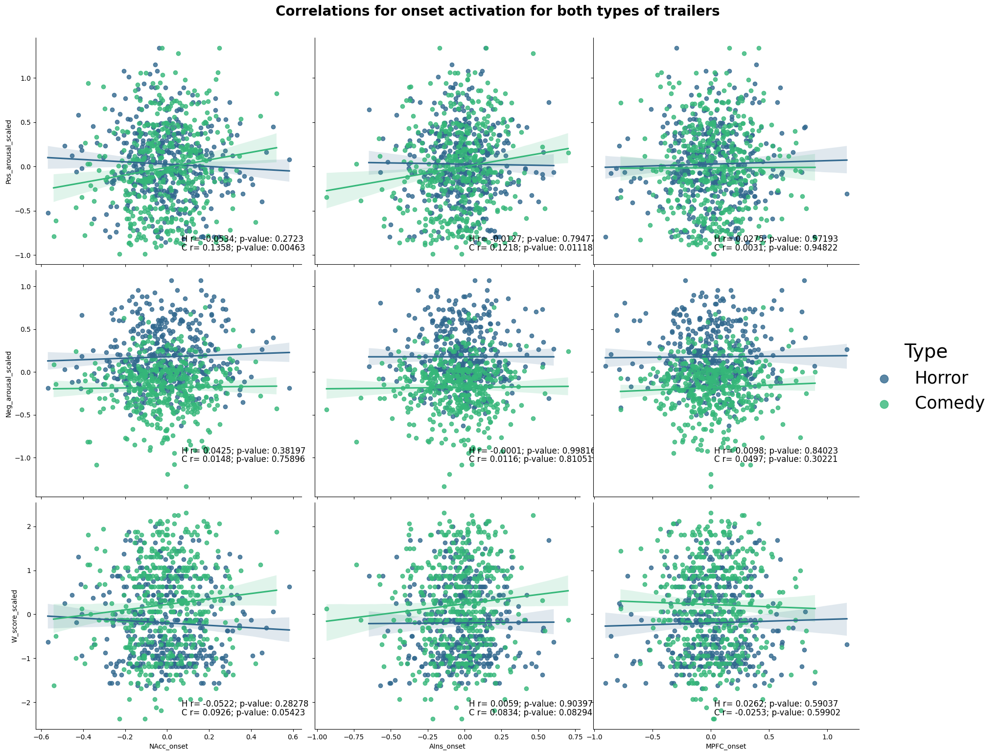

In [327]:
On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")



## Peak Max

In [328]:
# Correlation with Positive Arousal.
NAcc_PA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_All_corr[1])))
      



For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.04884 with a p-value of: 0.1528623673969959
For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: 0.05457 with a p-value of: 0.1102051498724086
For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.01398 with a p-value of: 0.6826297486189883

For both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.04494 with a p-value of: 0.18849461317628183
For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: 0.093 with a p-value of: 0.006412045601096369
For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.01227 with a p-value of: 0.7196291611786725

For both types of trailers, the correlation between NAcc positive peak activat

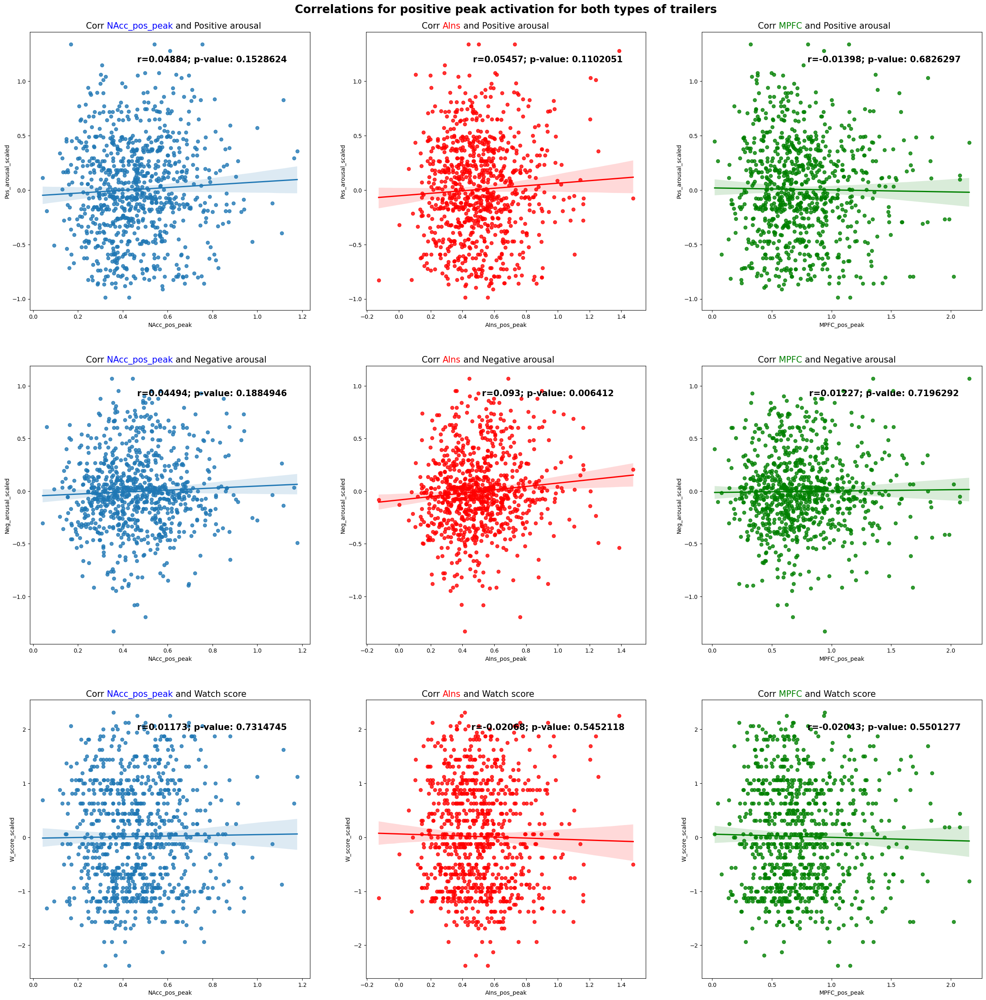

In [329]:
Pmax_all_corr = [NAcc_PA_Pmax_All_corr, NAcc_NA_Pmax_All_corr, NAcc_W_Pmax_All_corr, AIns_PA_Pmax_All_corr, AIns_NA_Pmax_All_corr, AIns_W_Pmax_All_corr, MPFC_PA_Pmax_All_corr, MPFC_NA_Pmax_All_corr, MPFC_W_Pmax_All_corr]
plot_correlations(all_subs_events_df, Pmax_all_corr, "pos_peak", "Correlations for positive peak activation for both types of trailers")


In [330]:
# Pos peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_C_corr[1])))
      
      


For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.08529 with a p-value of: 0.07624508694666024
For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: 0.04708 with a p-value of: 0.328357454061276
For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: 0.00297 with a p-value of: 0.9508388251458709

For comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.0014 with a p-value of: 0.9768874404034746
For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: 0.02168 with a p-value of: 0.652747390772043
For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.01075 with a p-value of: 0.8234907482320282

For comedy trailers, the correlation between NAcc positive peak activation and watch scores is: 0.05921 with a p-value of: 0

In [331]:
# Pos peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_H_corr[1])))


For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.0014 with a p-value of: 0.9770479355617553
For horror trailers, the correlation between AIns positive peak activation and positive arousal is: 0.05622 with a p-value of: 0.24744757394780204
For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.03249 with a p-value of: 0.5041769051319881

For horror trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.06435 with a p-value of: 0.1854744163113874
For horror trailers, the correlation between AIns positive peak activation and negative arousal is: 0.09376 with a p-value of: 0.05342681282770094
For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.05185 with a p-value of: 0.2862283573833214

For horror trailers, the correlation between NAcc positive peak activation and watch scores is: -0.03054 with a p-value 

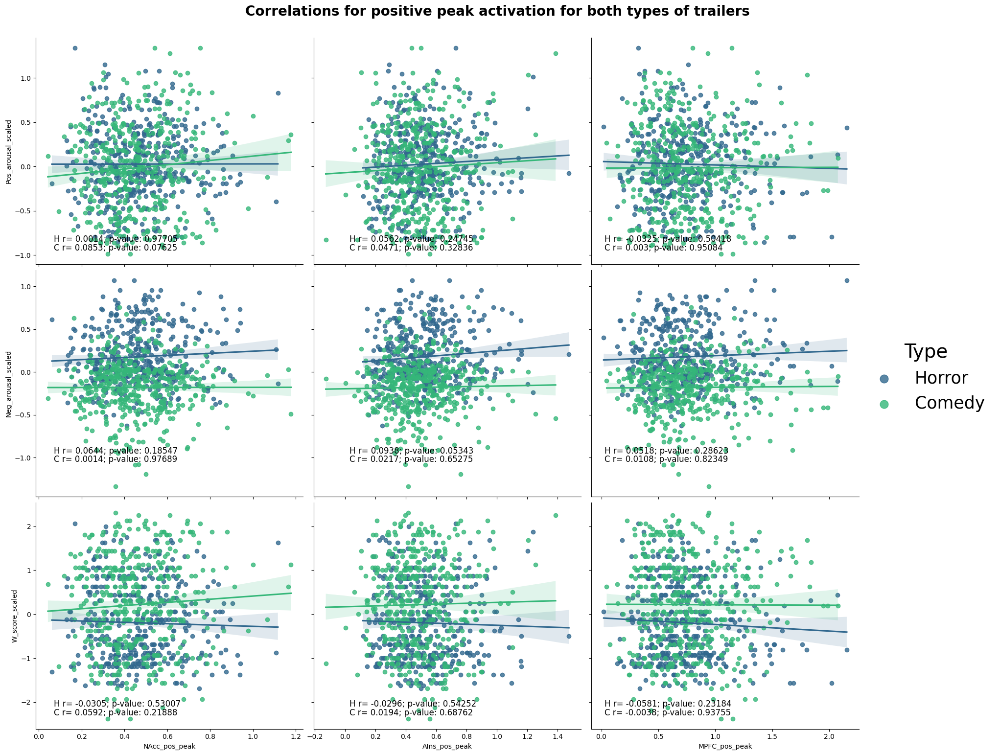

In [332]:
Pmax_comedy_corr = [NAcc_PA_Pmax_C_corr, NAcc_NA_Pmax_C_corr, NAcc_W_Pmax_C_corr, AIns_PA_Pmax_C_corr, AIns_NA_Pmax_C_corr, AIns_W_Pmax_C_corr, MPFC_PA_Pmax_C_corr, MPFC_NA_Pmax_C_corr, MPFC_W_Pmax_C_corr]
Pmax_horror_corr = [NAcc_PA_Pmax_H_corr, NAcc_NA_Pmax_H_corr, NAcc_W_Pmax_H_corr, AIns_PA_Pmax_H_corr, AIns_NA_Pmax_H_corr, AIns_W_Pmax_H_corr, MPFC_PA_Pmax_H_corr, MPFC_NA_Pmax_H_corr, MPFC_W_Pmax_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "pos_peak", Pmax_comedy_corr, Pmax_horror_corr, "Correlations for positive peak activation for both types of trailers")

## Peak min

In [333]:
# Correlation with Positive Arousal.
NAcc_PA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_All_corr[1])))
      
      

For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.02896 with a p-value of: 0.3968664527764374
For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: 0.02116 with a p-value of: 0.5360057522616668
For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.00964 with a p-value of: 0.7779025399126172

For both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.02596 with a p-value of: 0.4475929622904148
For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: 0.11732 with a p-value of: 0.0005741765742067887
For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.00093 with a p-value of: 0.9783967123645685

For both types of trailers, the correlation between NAcc negative peak acti

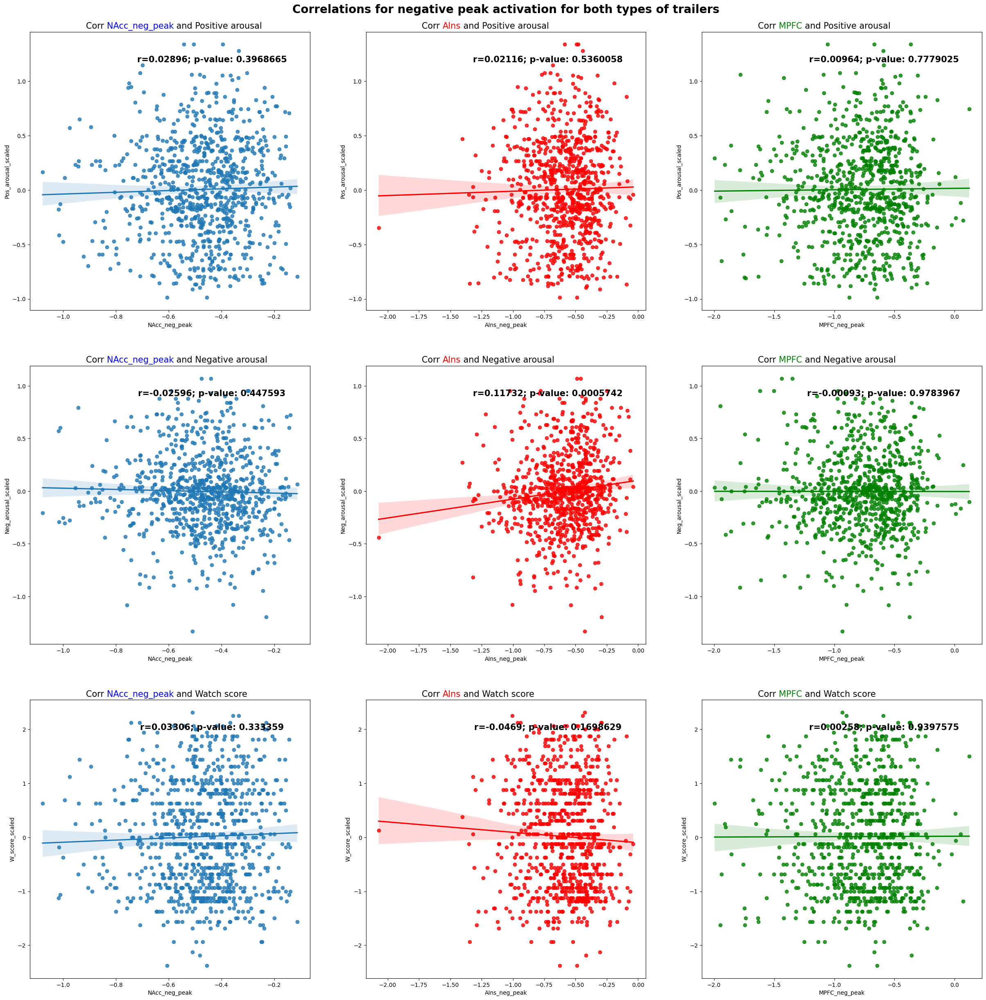

In [334]:
Pmin_all_corr = [NAcc_PA_Pmin_All_corr, NAcc_NA_Pmin_All_corr, NAcc_W_Pmin_All_corr, AIns_PA_Pmin_All_corr, AIns_NA_Pmin_All_corr, AIns_W_Pmin_All_corr, MPFC_PA_Pmin_All_corr, MPFC_NA_Pmin_All_corr, MPFC_W_Pmin_All_corr]
plot_correlations(all_subs_events_df, Pmin_all_corr, "neg_peak", "Correlations for negative peak activation for both types of trailers")

In [335]:
# Neg peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_C_corr[1])))


For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.03889 with a p-value of: 0.41952556628609633
For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: 0.09107 with a p-value of: 0.058300369118023505
For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: -0.02463 with a p-value of: 0.6092690930665429

For comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: 0.01988 with a p-value of: 0.679915348549554
For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: 0.07048 with a p-value of: 0.14312049817549863
For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: 0.0572 with a p-value of: 0.2349109779674046

For comedy trailers, the correlation between NAcc negative peak activation and watch scores is: 0.01372 with a p-value 

In [336]:
# Neg peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_H_corr[1])))
      

For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.0228 with a p-value of: 0.6393262668550845
For horror trailers, the correlation between AIns negative peak activation and positive arousal is: -0.09113 with a p-value of: 0.060521803811238874
For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.05197 with a p-value of: 0.28510071709665613

For horror trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.01783 with a p-value of: 0.7139330879380291
For horror trailers, the correlation between AIns negative peak activation and negative arousal is: 0.0442 with a p-value of: 0.36340034605238997
For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.06036 with a p-value of: 0.21430329160218586

For horror trailers, the correlation between NAcc negative peak activation and watch scores is: 0.03302 with a p-val

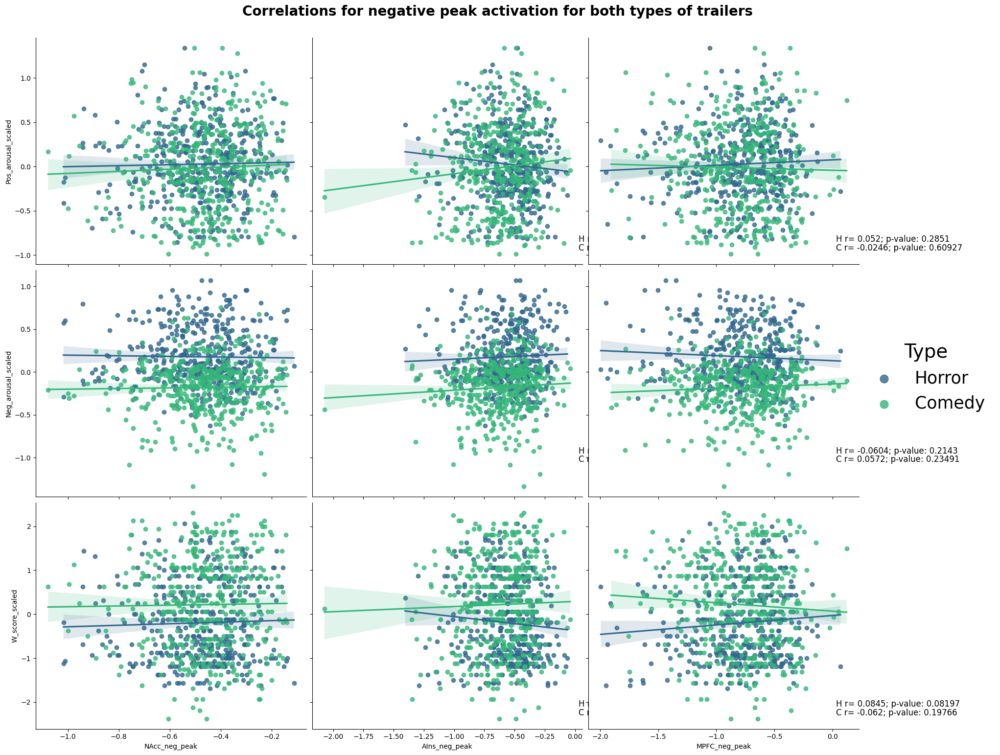

In [337]:
Pmin_comedy_corr = [NAcc_PA_Pmin_C_corr, NAcc_NA_Pmin_C_corr, NAcc_W_Pmin_C_corr, AIns_PA_Pmin_C_corr, AIns_NA_Pmin_C_corr, AIns_W_Pmin_C_corr, MPFC_PA_Pmin_C_corr, MPFC_NA_Pmin_C_corr, MPFC_W_Pmin_C_corr]
Pmin_horror_corr = [NAcc_PA_Pmin_H_corr, NAcc_NA_Pmin_H_corr, NAcc_W_Pmin_H_corr, AIns_PA_Pmin_H_corr, AIns_NA_Pmin_H_corr, AIns_W_Pmin_H_corr, MPFC_PA_Pmin_H_corr, MPFC_NA_Pmin_H_corr, MPFC_W_Pmin_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "neg_peak", Pmin_comedy_corr, Pmin_horror_corr, "Correlations for negative peak activation for both types of trailers")

## Positive peak (slope) 

## Positive peak (delta)

## Neural ISC

In [338]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.0733 with a p-value of: 0.031811577019703524
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.05119 with a p-value of: 0.134072175028174
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.09783 with a p-value of: 0.004127841823025

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.06549 with a p-value of: 0.055146844754096445
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.04593 with a p-value of: 0.17888701755092154
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: -0.03496 with a p-value of: 0.3063210695429557

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.0835 with a p-value of: 0.01442815427599

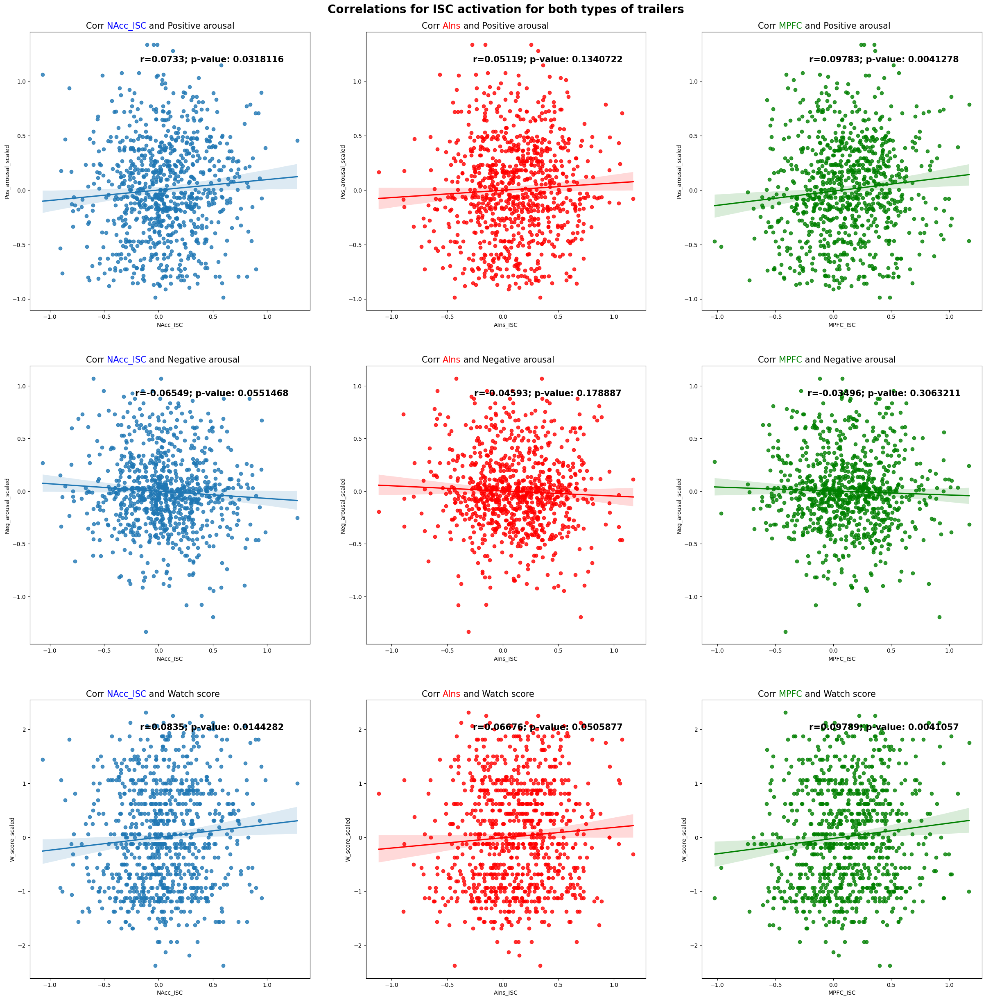

In [339]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [340]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.15845 with a p-value of: 0.0009377739048509482
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.08441 with a p-value of: 0.07934515962120695
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.13371 with a p-value of: 0.005324567949821048

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: -0.06967 with a p-value of: 0.1478308484085465
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.05688 with a p-value of: 0.23752036785496658
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: -0.06481 with a p-value of: 0.17824005095704584

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.14293 with a p-value of: 0.0028731306466955107
For comedy trailers, the correlation

In [341]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.03924 with a p-value of: 0.41969284473335844
For horror trailers, the correlation between AIns ISC activation and positive arousal is: 0.01603 with a p-value of: 0.7417173107242626
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.05509 with a p-value of: 0.25708396977097986

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.08998 with a p-value of: 0.06383883386610474
For horror trailers, the correlation between AIns ISC activation and negative arousal is: -0.01924 with a p-value of: 0.6925286026943174
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: 0.01467 with a p-value of: 0.7629374453892765

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.01464 with a p-value of: 0.7634350457950052
For horror trailers, the correlation between

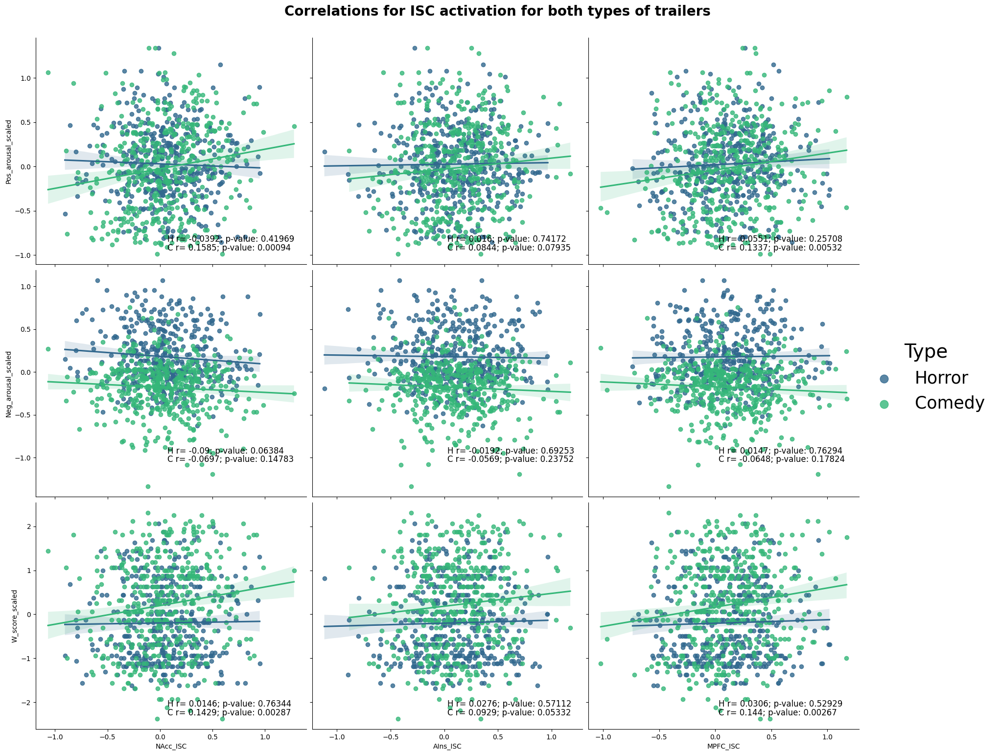

In [342]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


In [343]:
"""
# Not used. 
def corrfunc(x, y, **kws):
    print(x)
    r, _ = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r), xy=(.65, .9), xycoords=ax.transAxes) #0.65, 0.9
"""

'\n# Not used. \ndef corrfunc(x, y, **kws):\n    print(x)\n    r, _ = pearsonr(x, y)\n    ax = plt.gca()\n    ax.annotate("r = {:.2f}".format(r), xy=(.65, .9), xycoords=ax.transAxes) #0.65, 0.9\n'